

This notebook will be able to perform customer segmentation by using k-means clustering as well as be able to predict the churn rate probability


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
try:
    import lazypredict
except:
    !pip install lazypredict
    from lazypredict.Supervised import LazyClassifier
import seaborn as sns
from matplotlib.gridspec import GridSpec
from matplotlib import cm
from plotly.offline import iplot, init_notebook_mode
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

Import Dataset from Kaggle

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving customer_churn_dataset-training-master.csv to customer_churn_dataset-training-master (4).csv


In [ ]:
traindf = pd.read_csv('customer_churn_dataset-training-master.csv')
traindf

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.00,30.00,Female,39.00,14.00,5.00,18.00,Standard,Annual,932.00,17.00,1.00
1,3.00,65.00,Female,49.00,1.00,10.00,8.00,Basic,Monthly,557.00,6.00,1.00
2,4.00,55.00,Female,14.00,4.00,6.00,18.00,Basic,Quarterly,185.00,3.00,1.00
3,5.00,58.00,Male,38.00,21.00,7.00,7.00,Standard,Monthly,396.00,29.00,1.00
4,6.00,23.00,Male,32.00,20.00,5.00,8.00,Basic,Monthly,617.00,20.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.00,42.00,Male,54.00,15.00,1.00,3.00,Premium,Annual,716.38,8.00,0.00
440829,449996.00,25.00,Female,8.00,13.00,1.00,20.00,Premium,Annual,745.38,2.00,0.00
440830,449997.00,26.00,Male,35.00,27.00,1.00,5.00,Standard,Quarterly,977.31,9.00,0.00
440831,449998.00,28.00,Male,55.00,14.00,2.00,0.00,Standard,Quarterly,602.55,2.00,0.00


**Data Cleaning**

 Check for missing values or duplicates

In [ ]:
traindf.isnull().sum()


CustomerID           1
Age                  1
Gender               1
Tenure               1
Usage Frequency      1
Support Calls        1
Payment Delay        1
Subscription Type    1
Contract Length      1
Total Spend          1
Last Interaction     1
Churn                1
dtype: int64

In [ ]:
traindf.duplicated().sum()


0

**There** are no duplicates in the data

We will drop the missing values since there is only 1 in each column

In [ ]:
traindf.dropna(axis = 0 , inplace = True)
traindf.isnull().sum()

CustomerID           0
Age                  0
Gender               0
Tenure               0
Usage Frequency      0
Support Calls        0
Payment Delay        0
Subscription Type    0
Contract Length      0
Total Spend          0
Last Interaction     0
Churn                0
dtype: int64

We will now drop the Customer ID column since it is not needed for the analysis

In [ ]:
traindf.drop(columns = 'CustomerID' , inplace = True)
traindf

,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,30.00,Female,39.00,14.00,5.00,18.00,Standard,Annual,932.00,17.00,1.00
1,65.00,Female,49.00,1.00,10.00,8.00,Basic,Monthly,557.00,6.00,1.00
2,55.00,Female,14.00,4.00,6.00,18.00,Basic,Quarterly,185.00,3.00,1.00
3,58.00,Male,38.00,21.00,7.00,7.00,Standard,Monthly,396.00,29.00,1.00
4,23.00,Male,32.00,20.00,5.00,8.00,Basic,Monthly,617.00,20.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...
440828,42.00,Male,54.00,15.00,1.00,3.00,Premium,Annual,716.38,8.00,0.00
440829,25.00,Female,8.00,13.00,1.00,20.00,Premium,Annual,745.38,2.00,0.00
440830,26.00,Male,35.00,27.00,1.00,5.00,Standard,Quarterly,977.31,9.00,0.00
440831,28.00,Male,55.00,14.00,2.00,0.00,Standard,Quarterly,602.55,2.00,0.00


We will take a preliminary look at the data categories to check for significant outliers in the data


In [ ]:
# Set up the subplots grid
fig = make_subplots(rows=3, cols=4,
# Set the subplot titles
subplot_titles=['Age', 'Tenure', 'Usage Frequency','Support Calls','Payment Delay', 'Total Spend', 'Last Interaction'])
#create boxplot visualization of numeric columns
plotdf = traindf
plotdf = traindf.columns = [i.lower().replace(' ','_') for i in plotdf.columns]
fig.add_trace(go.Box(x=traindf.age, name='', showlegend=False), row=1, col=1)
fig.add_trace(go.Box(x=traindf.tenure, name='', showlegend=False), row=1, col=2)
fig.add_trace(go.Box(x=traindf.usage_frequency, name='', showlegend=False), row=1, col=3)
fig.add_trace(go.Box(x=traindf.support_calls, name='', showlegend=False), row=1, col=4)
fig.add_trace(go.Box(x=traindf.payment_delay, name='', showlegend=False), row=2, col=1)
fig.add_trace(go.Box(x=traindf.total_spend, name='', showlegend=False), row=2, col=2)
fig.add_trace(go.Box(x=traindf.last_interaction, name='', showlegend=False), row=2, col=3)
#config size
fig.update_layout(height=600, width=1200)
#show visualizations
fig.show()


Since there is no significant outliers we will continue with the analysis


We will compare the number of customers who have churned

Text(0.5, 1.0, 'Target Variable')

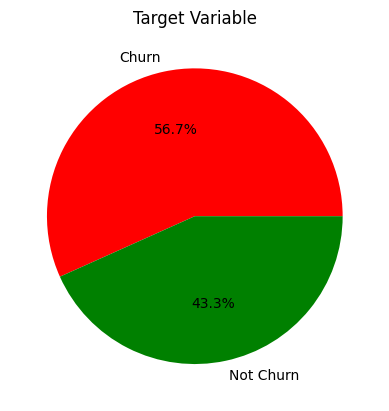

In [ ]:
# Target variable
plt.pie(data = traindf['churn'].value_counts().to_frame() ,labels = ['Churn','Not Churn'], x = 'churn' , autopct = '%1.1f%%' ,colors = ['red','green'],textprops={'color':"black"} )
plt.title('Target Variable')

There are significantly more customers who have churned than customers who have not churned we will explore who they are and possible reasons why they are churning


We will create visuals in order to determine why a customer would churn




Text(0.5, 0.98, 'Churn Rate Based on Age')

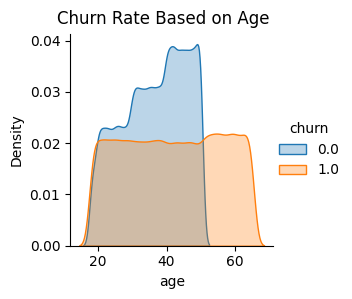

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'age',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Age")

In [ ]:
#barplot of churn rate by gender
my_scale = ['pink','blue']
#histogram with plotly
fig = px.histogram(traindf, x="churn",
color='gender', barmode='group',
color_discrete_sequence =my_scale, opacity=0.9,text_auto=True,
height=450, width = 450)
fig.update_layout(title_text='Churn Rate by Gender',title_font_size=16, title_x=0.5,
font_family='Bahnschrift SemiBold',
yaxis_title=None, xaxis_title=None)
fig.update_traces(textfont_size=14, textangle=0, textposition="outside", cliponaxis=False,
marker_line_width=1,marker_line_color="black")

Text(0.5, 0.98, 'Churn Rate Based on Tenure')

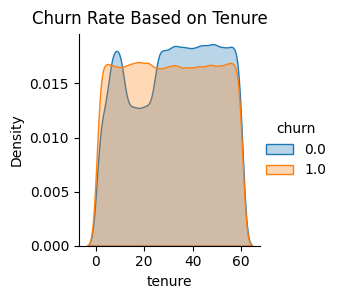

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'tenure',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Tenure")

Text(0.5, 0.98, 'Churn Rate Based on Usage Frequency')

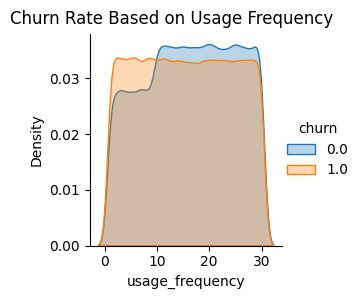

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'usage_frequency',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Usage Frequency")

Text(0.5, 0.98, 'Churn Rate Based on Number of Support Calls')

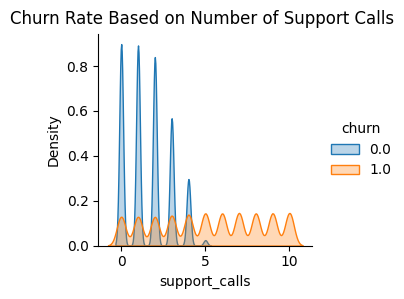

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'support_calls',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Number of Support Calls")

Text(0.5, 0.98, 'Churn Rate Based on Payment Delay in Terms of Days')

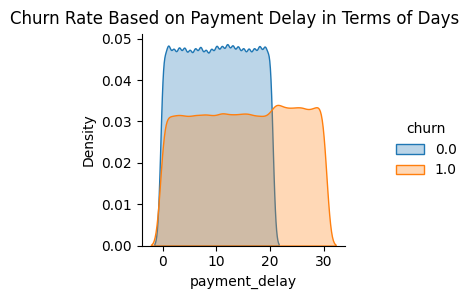

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'payment_delay',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Payment Delay in Terms of Days")

In [ ]:
#barplot of churn rate by subscription type
my_scale = ['blue','orange','green']
#histogram with plotly
fig = px.histogram(traindf, x="churn",
color='subscription_type', barmode='group',
color_discrete_sequence =my_scale, opacity=0.9,text_auto=True,
height=450, width = 450)
fig.update_layout(title_text='Churn Rate by Subscription Type',title_font_size=16, title_x=0.5,
font_family='Bahnschrift SemiBold',
yaxis_title=None, xaxis_title=None)
fig.update_traces(textfont_size=14, textangle=0, textposition="outside", cliponaxis=False,
marker_line_width=1,marker_line_color="black")

In [ ]:
#barplot of churn rate by contract length
my_scale = ['blue','orange','green']
#histogram with plotly
fig = px.histogram(traindf, x="churn",
color='contract_length', barmode='group',
color_discrete_sequence =my_scale, opacity=0.9,text_auto=True,
height=450, width = 450)
fig.update_layout(title_text='Churn Rate by Subscription Type',title_font_size=16, title_x=0.5,
font_family='Bahnschrift SemiBold',
yaxis_title=None, xaxis_title=None)
fig.update_traces(textfont_size=14, textangle=0, textposition="outside", cliponaxis=False,
marker_line_width=1,marker_line_color="black")

Text(0.5, 0.98, 'Churn Rate Based on Total Spend')

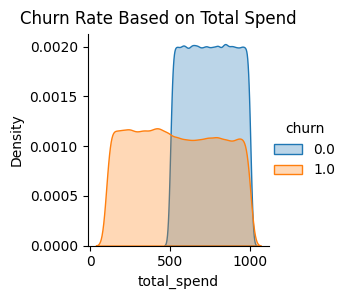

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'total_spend',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Total Spend")

Text(0.5, 0.98, 'Churn Rate Based on Days Since Last Interaction')

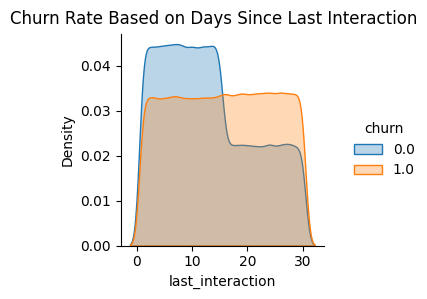

In [ ]:
g = sns.FacetGrid(traindf,hue='churn')
g = g.map(sns.kdeplot,'last_interaction',shade=True,alpha=0.3)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Churn Rate Based on Days Since Last Interaction")

We will now categorize gender, subscription type, and contract length in order to continue exploring the data

In [ ]:
traindf['gender'] = traindf['gender'].replace({'Female': 0, 'Male': 1})
traindf['subscription_type'] = traindf['subscription_type'].replace({'Basic': 1, 'Standard': 2, 'Premium': 3})
traindf['contract_length'] = traindf['contract_length'].replace({'Monthly': 1, 'Quarterly': 2, 'Annual': 3})

In [ ]:
traindf.head()

,age,gender,tenure,usage_frequency,support_calls,payment_delay,subscription_type,contract_length,total_spend,last_interaction,churn
0,30.00,0,39.00,14.00,5.00,18.00,2,3,932.00,17.00,1.00
1,65.00,0,49.00,1.00,10.00,8.00,1,1,557.00,6.00,1.00
2,55.00,0,14.00,4.00,6.00,18.00,1,2,185.00,3.00,1.00
3,58.00,1,38.00,21.00,7.00,7.00,2,1,396.00,29.00,1.00
4,23.00,1,32.00,20.00,5.00,8.00,1,1,617.00,20.00,1.00


We will run a correlation test in order to see which variables are correlated with one another along with the churn rate

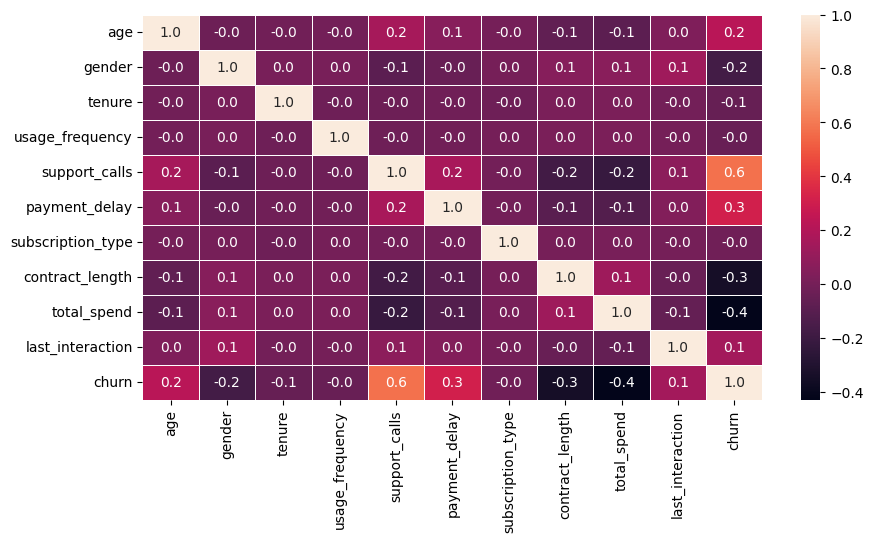

In [ ]:
fig,ax=plt.subplots(figsize = (10,5))
sns.heatmap(traindf.corr(),annot= True,linewidths=0.5,fmt = ".1f",ax=ax);

There is no significant correlation between any of the variables resulting in multicollinearity. Support Calls is moderately correlated with the churn rate as well as Payment Delay. Interestingly the total spent by the customer is moderately negatively correlated with the churn rate meaning that more customers spend the less likely they are to churn. Total spend is negatively moderately correlated with the churn rate indicating the more the customer spends, the less likely they are to churn.